In [26]:
!pip install rasterio opencv-python-headless geopandas folium  rasterstats numpy scikit-learn matplotlib tensorflow

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/390.3 MB ? eta -:--:--
   ---------------------------------------- 2.4/390.3 MB 11.2 MB/s eta 0:00:35
   ---------------------------------------- 4.7/390.3 MB 11.4 MB/s eta 0:00:34
    --------------------------------------- 7.1/390.3 MB 11.5 MB/s eta 0:00:34
    --------------------------------------- 9.4/390.3 MB 11.5 MB/s eta 0:00:34
   - -------------------------------------- 11.8/390.3 MB 11.5 MB/s eta 0:00:33
   - -------------------------------------- 14.2/390.3 MB 11.7 MB/s eta 0:00:33
   - -------------------------------------- 16.5/390.3 MB 11.7 MB/s eta 0:00:32
   - -------------------------------------- 18.9/390.3 MB 11.7 MB/s eta 0:00:32
   -- ------------------------------------- 21.2/390.3 MB 11.7 MB/s eta 0:00:32
   -- ------------------------------------- 23.6/390.3 MB 11.7 MB/s eta 0:00:32
   -- ------------------------------------- 26.0/390.3 

  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [37]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from rasterio.windows import Window
import pandas as pd
import geopandas as gpd
from pylab import rcParams
import matplotlib
rcParams['figure.figsize'] = 18, 16
from sklearn.model_selection import train_test_split
from rasterio.plot import show
from shapely.geometry import box
import seaborn as sns


In [38]:
path_img = 'resources/solo_test/AOI_img.tif'
path_classe1 = 'resources/solo_test/Solo.shp'
path_classe2 = 'resources/solo_test/Veg.shp'
path_classe3 = 'resources/solo_test/Invasoras.shp'

In [39]:
gdf1 = gpd.read_file(path_classe1)
gdf2 = gpd.read_file(path_classe2)
gdf3 = gpd.read_file(path_classe3)

<Axes: >

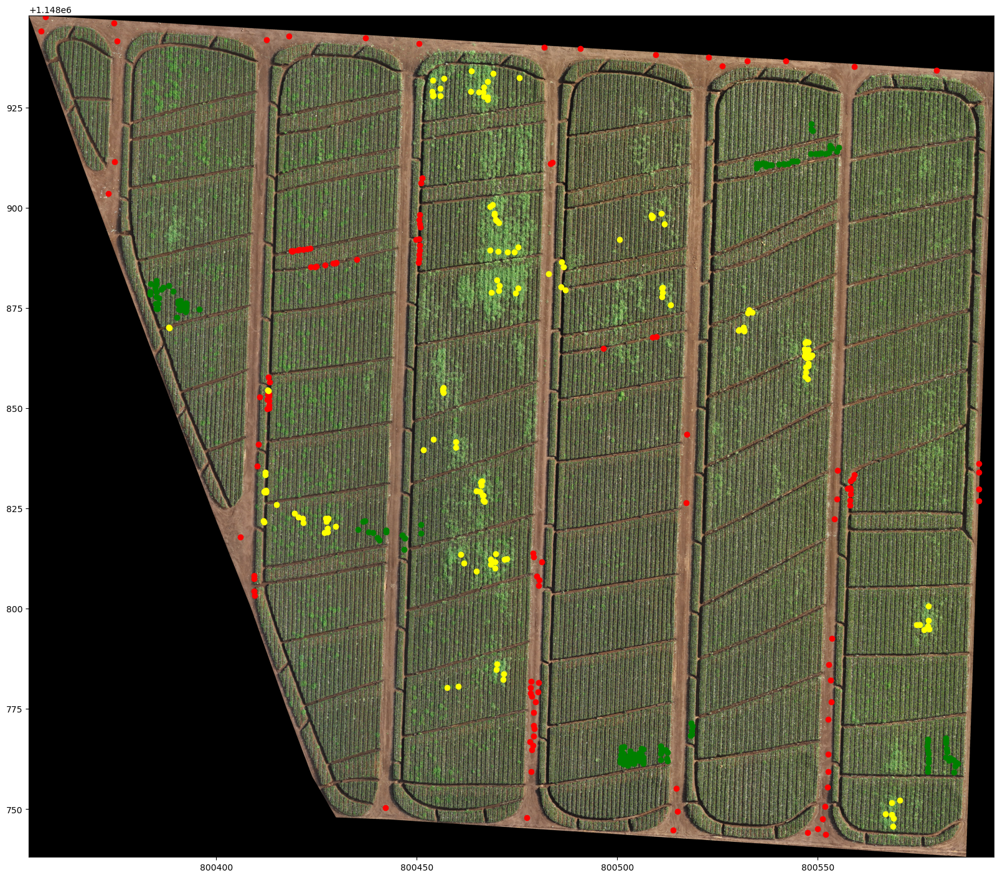

In [40]:
fig, ax = plt.subplots(figsize=(20, 20))
with rasterio.open(path_img) as src:
    gdf1 = gdf1.to_crs(src.crs.to_dict())
    gdf2 = gdf2.to_crs(src.crs.to_dict())
    gdf3 = gdf3.to_crs(src.crs.to_dict())
    show(src,ax=ax)
gdf1.plot(ax=ax, color='red')
gdf2.plot(ax=ax, color='green')
gdf3.plot(ax=ax, color='yellow')

In [41]:
gdf1['id'] = 0
gdf2['id'] = 1
gdf3['id'] = 2

In [42]:
gdf = pd.concat([gdf1,gdf2,gdf3], axis=0)

In [43]:
gdf

,id,geometry
0,0,POINT (800522.754 1148937.597)
1,0,POINT (800541.974 1148936.659)
2,0,POINT (800559.084 1148935.253)
3,0,POINT (800579.593 1148934.315)
4,0,POINT (800509.628 1148938.182)
...,...,...
147,2,POINT (800469.285 1148898.636)
148,2,POINT (800469.285 1148898.375)
149,2,POINT (800469.629 1148897.139)
150,2,POINT (800470.038 1148896.72)


In [49]:
coord_list = [(x, y) for x, y in zip(gdf.geometry.x, gdf.geometry.y)]

In [50]:
Values_list = []
Column_list = []
with rasterio.open(path_img) as src:
  Values = [x for x in src.sample(coord_list)]
  Values_list.append(Values)

In [51]:
X = np.array(Values_list)
X = X[0].copy()
X = X[:,0:3].copy()

In [52]:
X.shape

(431, 3)

In [53]:
Y = gdf['id'].values
Y = Y[:,np.newaxis]

In [55]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import confusion_matrix

In [56]:
enc = OneHotEncoder()

enc.fit(Y)

Y = enc.transform(Y).toarray()

In [57]:
Y.shape

(431, 3)

In [58]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, random_state = 42)

In [59]:
input_shape = (X_train.shape[1:])
num_classes = len(np.unique(gdf['id'].values))

In [60]:
input_shape

(3,)

In [61]:
num_classes

3

CONTRUÇÃO DA REDE NEURAL


In [72]:
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [71]:
print("Input shape:", input_shape)
print("Number of classes:", num_classes)
print("X_train shape:", X_train.shape)
print("Y_train shape:", Y_train.shape)

Input shape: (3,)
Number of classes: 3
X_train shape: (301, 3)
Y_train shape: (301, 3)


In [73]:
model = Sequential()
model.add(Dense(256, input_shape=input_shape, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

C:\Users\user\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [74]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [75]:
model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_55 (Dense)                │ (None, 256)            │         1,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 8)              │           520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 3)              │            27 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,723 (166.89 KB)

 Trainable params: 42,723 (166.89 KB)

 Non-trainable params: 0 (0.00 B)

In [76]:
history = model.fit(X_train, Y_train, epochs=400, batch_size=250, verbose=1, validation_split=0.25)

Epoch 1/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.3733 - loss: 2.6911 - val_accuracy: 0.3289 - val_loss: 2.1136
Epoch 2/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.2533 - loss: 2.2767 - val_accuracy: 0.3816 - val_loss: 2.0784
Epoch 3/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.3733 - loss: 2.1912 - val_accuracy: 0.3158 - val_loss: 1.2765
Epoch 4/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.2489 - loss: 1.2847 - val_accuracy: 0.3026 - val_loss: 1.2317
Epoch 5/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.2489 - loss: 1.2207 - val_accuracy: 0.2105 - val_loss: 1.1321
Epoch 6/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.1644 - loss: 1.1267 - val_accuracy: 0.1447 - val_loss: 1.0899
Epoch 7/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.2178 - loss: 1.0896 - val_accuracy: 0.4605 - val_loss: 1.0408
Epoch 8/400
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.5067 - loss: 1.0483 - val_accuracy: 0.4211 - val_loss: 1

TypeError: _process_plot_var_args.__call__() got multiple values for argument 'axes'

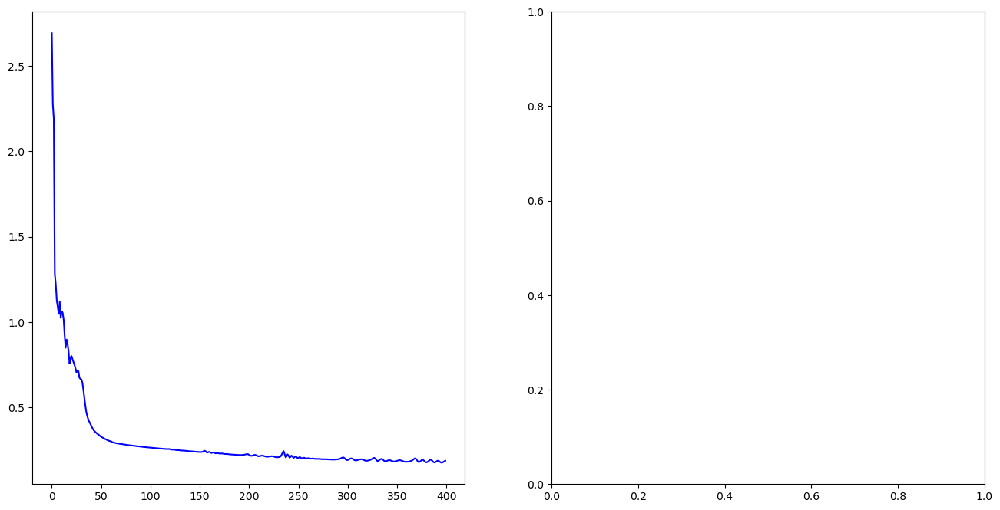

In [78]:
fig, ax = plt.subplots(1,2, figsize=(16,8))
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [79]:
score = model.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.20475904643535614
Test accuracy: 0.9153845906257629


In [80]:
y_pred = model.predict(X_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 


In [81]:
y_pred_res = np.argmax(y_pred, axis=1)

In [82]:
Y_test_res = np.argmax(Y_test, axis=1)

In [83]:
print(classification_report(Y_test_res, y_pred_res))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        49
           1       0.89      0.82      0.85        38
           2       0.85      0.93      0.89        43

    accuracy                           0.92       130
   macro avg       0.91      0.91      0.91       130
weighted avg       0.92      0.92      0.92       130



In [84]:
c_matrix = confusion_matrix(Y_test_res, y_pred_res)

In [85]:
names = ['Solo','Vegetação','Daninhas']

Text(0.5, 58.7222222222222, 'Predict')

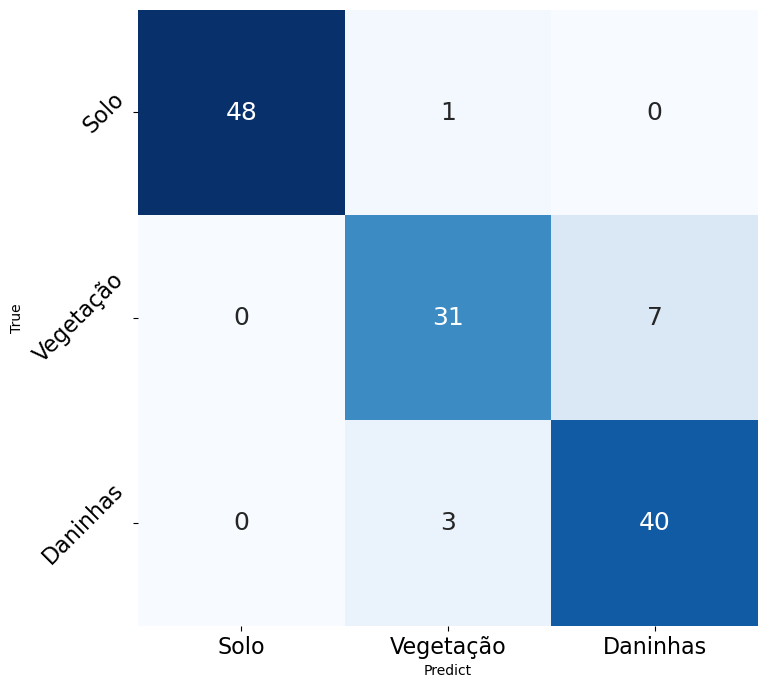

In [86]:
r1 = pd.DataFrame(data=c_matrix, index= names, columns=names)
fig, ax = plt.subplots(figsize=(8,8))
ax = sns.heatmap(r1, annot=True, annot_kws={"size": 18},fmt='d',cmap="Blues", cbar = False)
ax.tick_params(labelsize=16)
ax.set_yticklabels(names, rotation=45)
ax.set_ylabel('True')
ax.set_xlabel('Predict')

In [87]:
src = rasterio.open(path_img)
img = src.read()

In [88]:
img = img.transpose([1,2,0])
img_size = (img.shape[0] , img.shape[1])
img = img.reshape(img.shape[0] * img.shape[1], img.shape[2])

In [89]:
img.shape

(51650802, 4)

In [90]:
df = pd.DataFrame(img, columns=['R','G','B','Mask'])

In [91]:
df

,R,G,B,Mask
0,164,130,109,255
1,162,128,106,255
2,161,127,105,255
3,160,127,106,255
4,157,124,102,255
...,...,...,...,...
51650797,0,0,0,0
51650798,0,0,0,0
51650799,0,0,0,0
51650800,0,0,0,0


In [92]:
del img, src

In [93]:
df_to_pred = df[df['Mask'] == 255].copy()
values_to_pred = df_to_pred.values[:,0:3]

In [94]:
df_to_pred.drop(columns={'R', 'G', 'B'}, inplace = True)
df.drop(columns={'R', 'G', 'B'}, inplace = True)

In [95]:
pred = model.predict(values_to_pred)

1251127/1251127 ━━━━━━━━━━━━━━━━━━━━ 768s 614us/step


In [96]:
pred = np.argmax(pred, axis=1).copy()
df_to_pred['pred'] = pred

In [97]:
del pred, values_to_pred, model

In [98]:
df = pd.merge(df,df_to_pred, how='left', left_index=True, right_index=True)

In [99]:
del df_to_pred

In [100]:
values_to_export = df['pred'].values

In [101]:
del df

In [102]:
classify = values_to_export.reshape(img_size)
export_image = classify[np.newaxis,:,:]

In [103]:
export_image.dtype

dtype('float64')

In [106]:
src = rasterio.open(path_img)
out_meta = src.meta.copy()
out_meta.update({"driver": "GTiff",
                  "height": export_image.shape[1],
                  "width": export_image.shape[2],
                  "compress":'lzw',
                  "nodata": np.nan,
                  "dtype": 'float64',
                  "count":1
                  })

In [110]:
with rasterio.open('resources/solo_test/mapa.tif', "w", **out_meta) as dest:
     dest.write(export_image)

output_map = 'resources/solo_test/mapa.tif'

<Axes: >

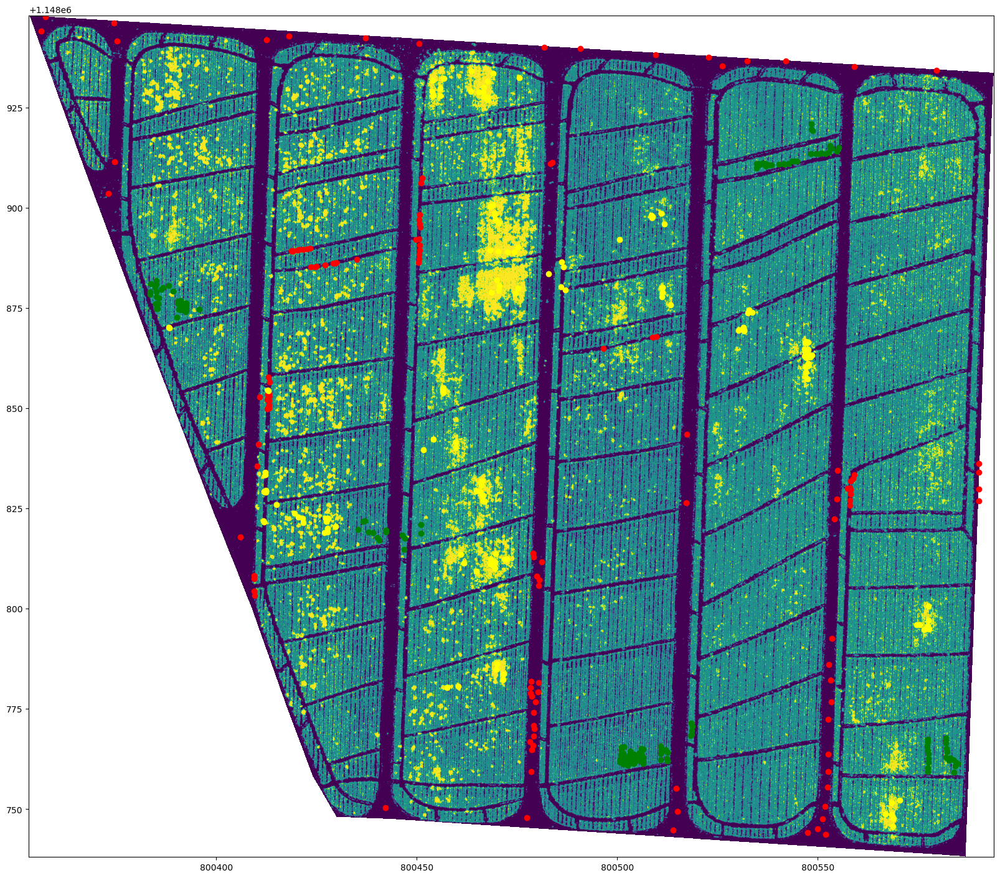

In [111]:
output_map.plo